In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 160), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  635.526 3.02647 0.307939


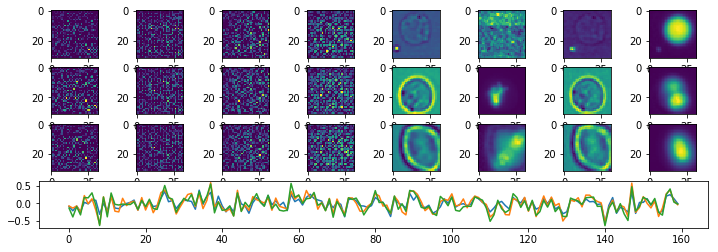

Epoch:  1 Iteration:  0 Loss:  21.565 0.639748 0.002455


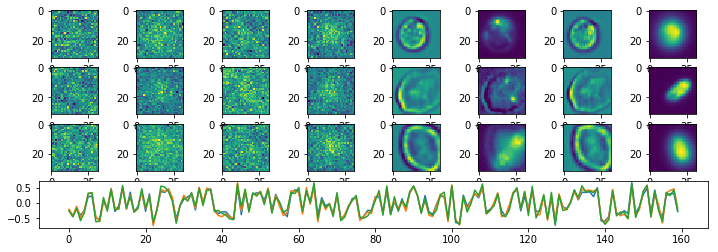

Epoch:  2 Iteration:  0 Loss:  16.5034 0.636765 0.000151455


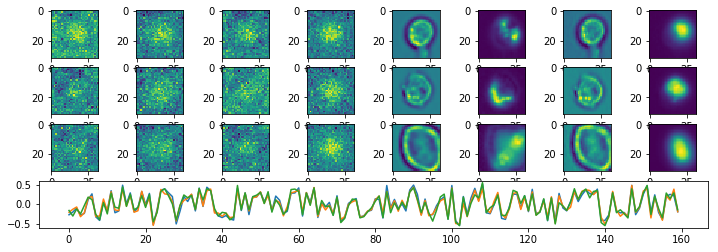

Epoch:  3 Iteration:  0 Loss:  15.4599 0.636296 0.00315398


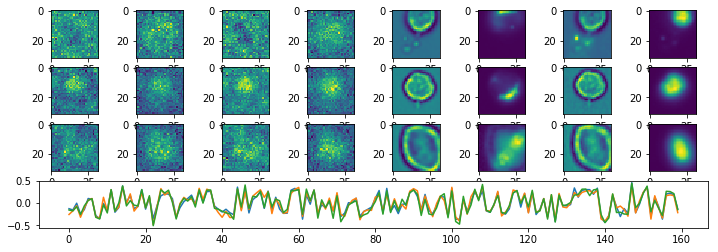

Epoch:  4 Iteration:  0 Loss:  12.2513 0.634572 0.00145563


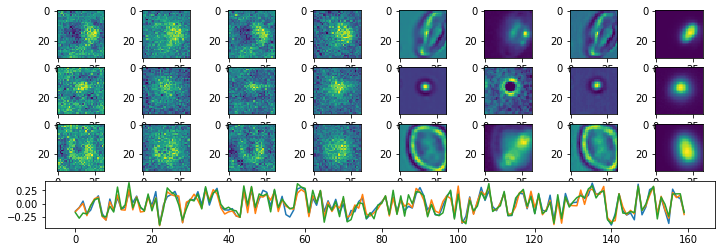

Epoch:  5 Iteration:  0 Loss:  11.7126 0.634333 0.0026032


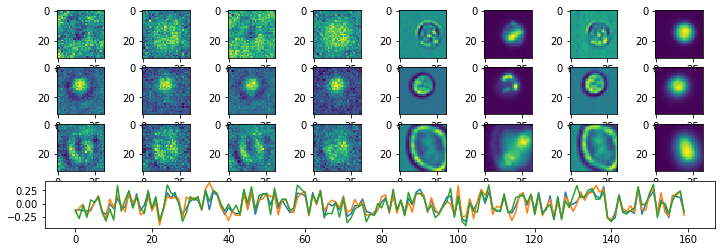

Epoch:  6 Iteration:  0 Loss:  10.2708 0.633569 0.00221023


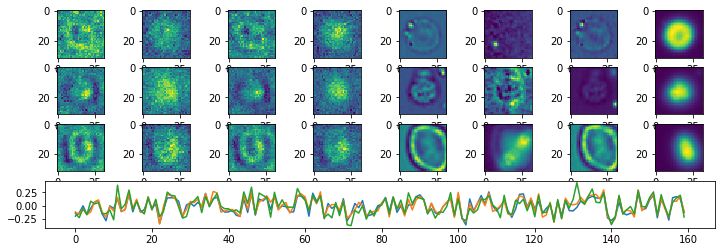

Epoch:  7 Iteration:  0 Loss:  9.20044 0.632984 0.00115067


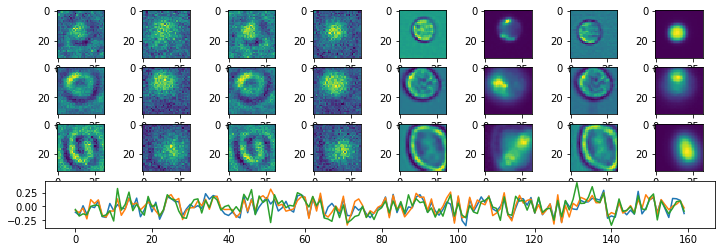

Epoch:  8 Iteration:  0 Loss:  8.4466 0.63259 0.00145864


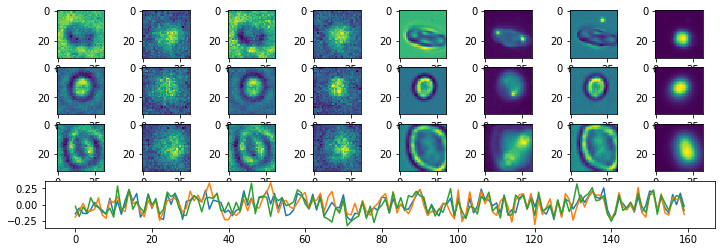

Epoch:  9 Iteration:  0 Loss:  7.81015 0.632262 0.00131506


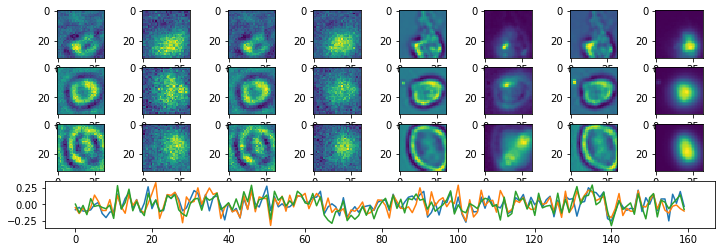

Epoch:  10 Iteration:  0 Loss:  7.55569 0.632126 0.00176272


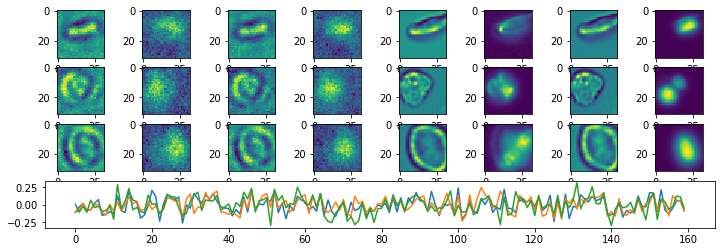

Epoch:  11 Iteration:  0 Loss:  7.26015 0.631972 0.00174996


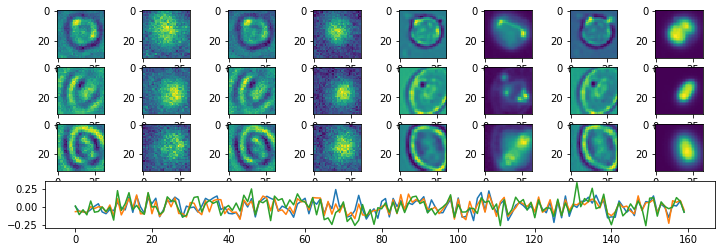

Epoch:  12 Iteration:  0 Loss:  6.99697 0.631826 0.000217646


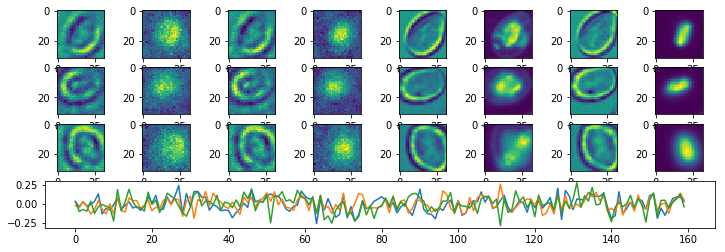

Epoch:  13 Iteration:  0 Loss:  6.69905 0.631677 0.00183445


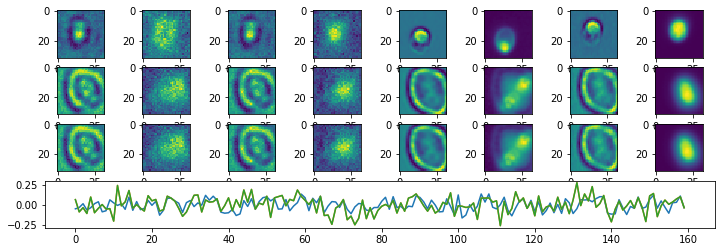

Epoch:  14 Iteration:  0 Loss:  6.26321 0.631451 0.00100404


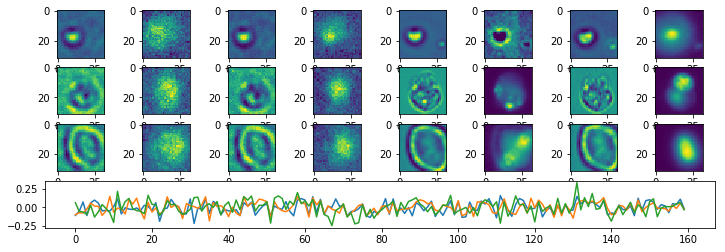

Epoch:  15 Iteration:  0 Loss:  6.09226 0.63136 0.00130698


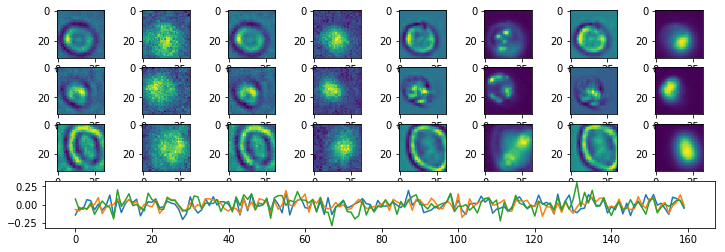

Epoch:  16 Iteration:  0 Loss:  5.89917 0.631258 0.00134048


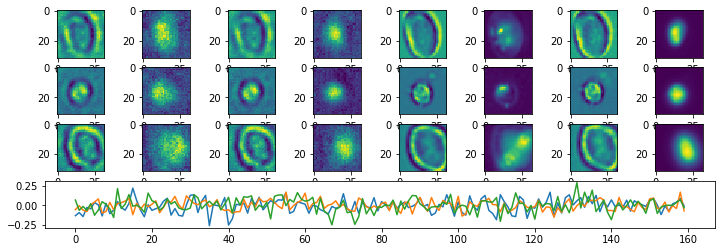

Epoch:  17 Iteration:  0 Loss:  5.71159 0.631161 0.000685841


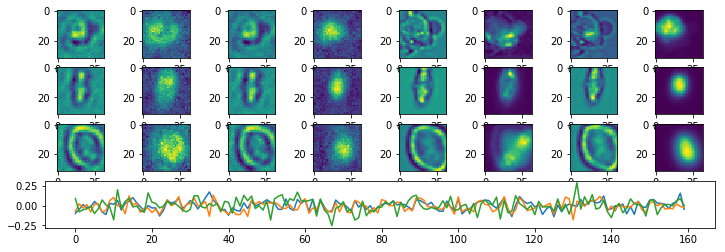

Epoch:  18 Iteration:  0 Loss:  5.57387 0.63109 0.000703722


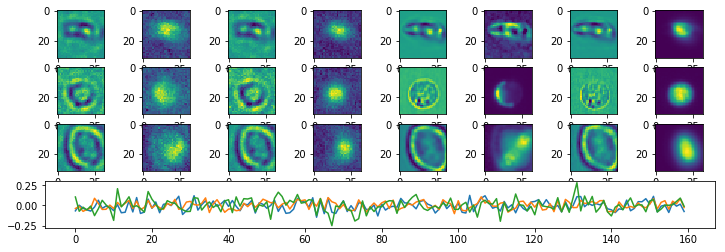

Epoch:  19 Iteration:  0 Loss:  5.44187 0.63102 0.000980318


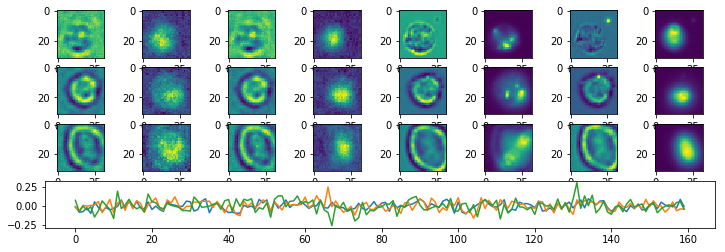

Epoch:  20 Iteration:  0 Loss:  5.29539 0.630942 0.00132704


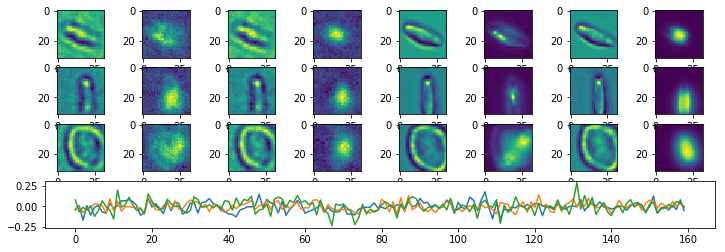

Epoch:  21 Iteration:  0 Loss:  5.17069 0.630876 0.000779301


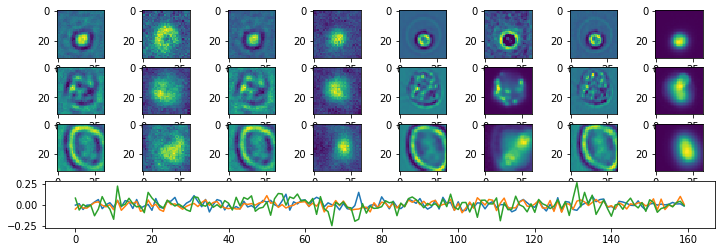

Epoch:  22 Iteration:  0 Loss:  4.98837 0.630776 0.000529826


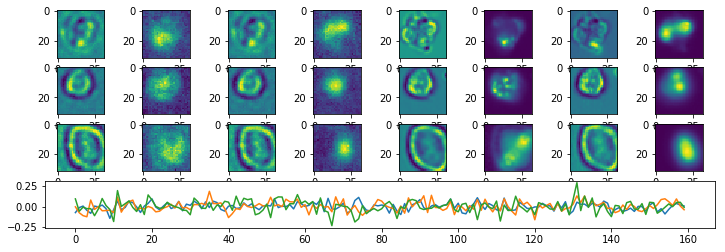

Epoch:  23 Iteration:  0 Loss:  4.86223 0.63071 0.000666767


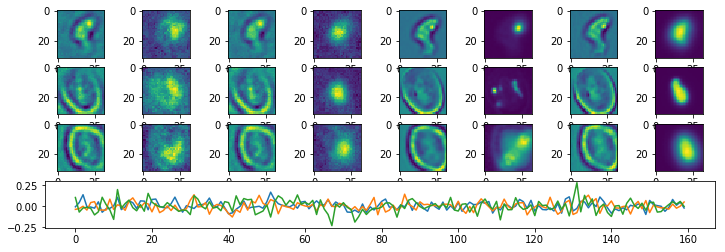

Epoch:  24 Iteration:  0 Loss:  4.73345 0.630641 0.00096947


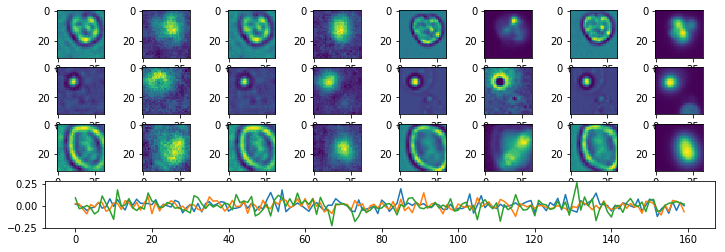

Epoch:  25 Iteration:  0 Loss:  4.70945 0.630628 0.00104412


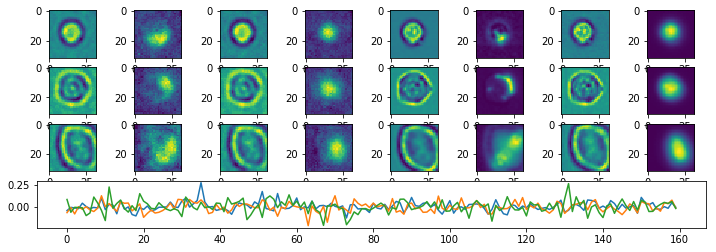

Epoch:  26 Iteration:  0 Loss:  4.5404 0.630541 0.000513047


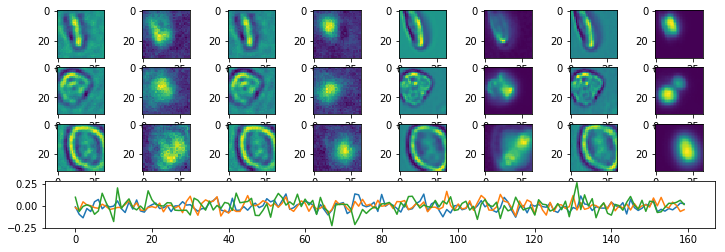

Epoch:  27 Iteration:  0 Loss:  4.53839 0.630536 0.00124061


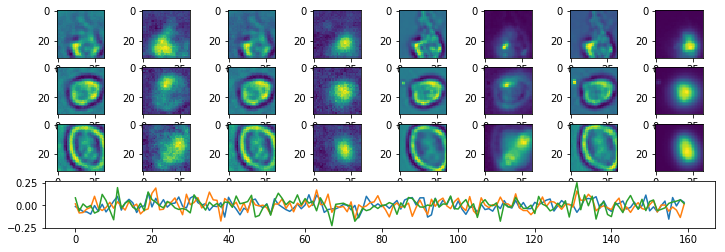

Epoch:  28 Iteration:  0 Loss:  4.3568 0.630441 0.000965506


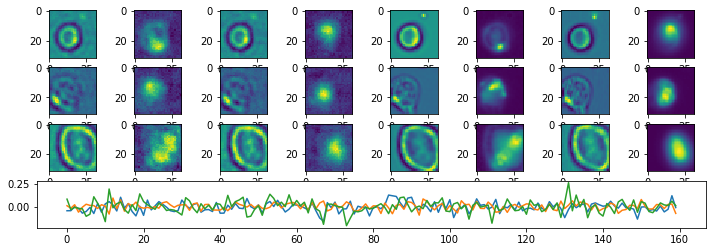

Epoch:  29 Iteration:  0 Loss:  4.2888 0.630406 0.000652343


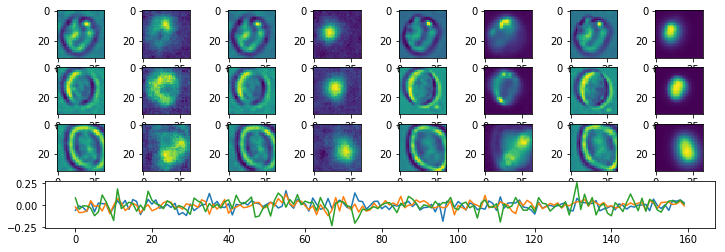

Epoch:  30 Iteration:  0 Loss:  4.26852 0.630396 0.000479817


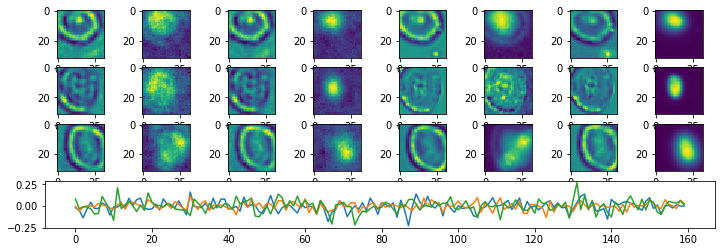

Epoch:  31 Iteration:  0 Loss:  4.18249 0.630349 0.000107169


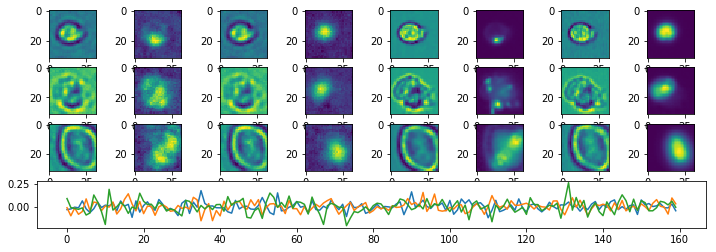

Epoch:  32 Iteration:  0 Loss:  4.10858 0.630311 0.000334352


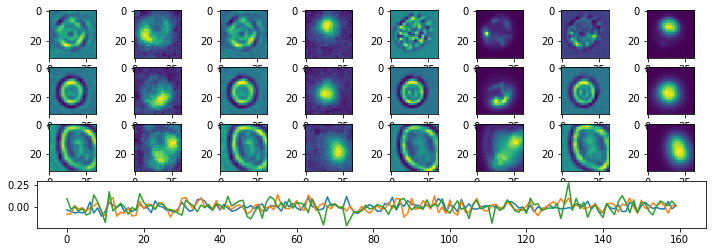

Epoch:  33 Iteration:  0 Loss:  4.06767 0.63029 0.00026831


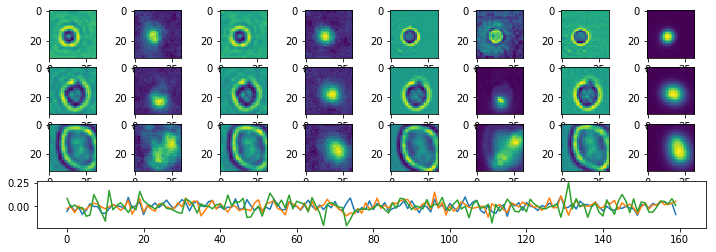

Epoch:  34 Iteration:  0 Loss:  4.01166 0.63026 0.000840634


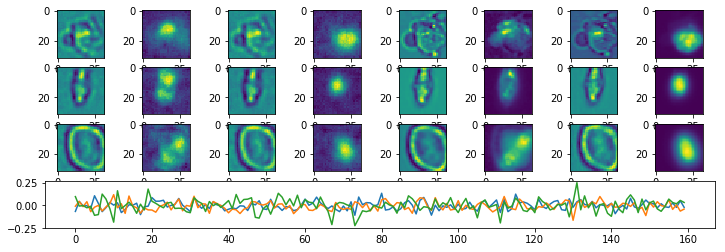

Epoch:  35 Iteration:  0 Loss:  3.95373 0.630229 0.000907093


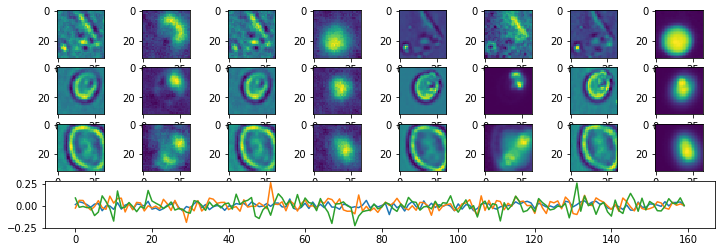

Epoch:  36 Iteration:  0 Loss:  3.89564 0.630199 0.000517279


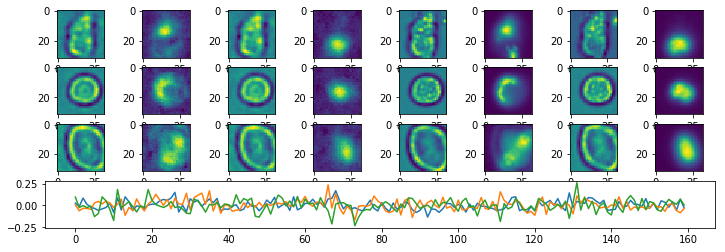

Epoch:  37 Iteration:  0 Loss:  3.87509 0.63019 0.000385493


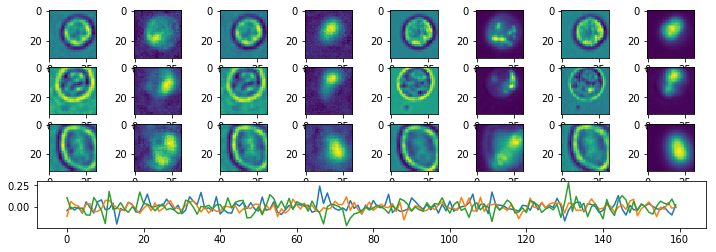

Epoch:  38 Iteration:  0 Loss:  3.81763 0.630159 0.000585645


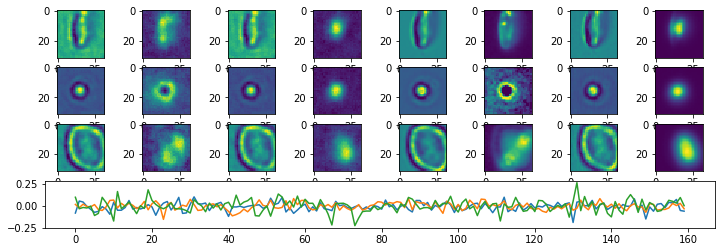

Epoch:  39 Iteration:  0 Loss:  3.76862 0.630132 0.000218153


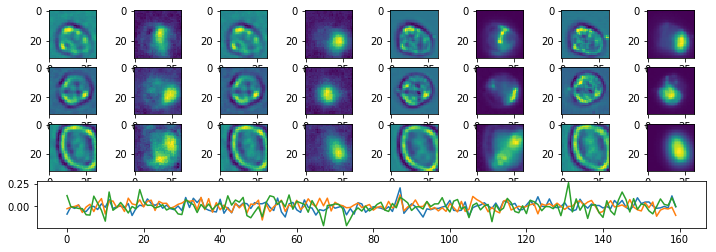

Epoch:  40 Iteration:  0 Loss:  3.71711 0.630105 0.000198305


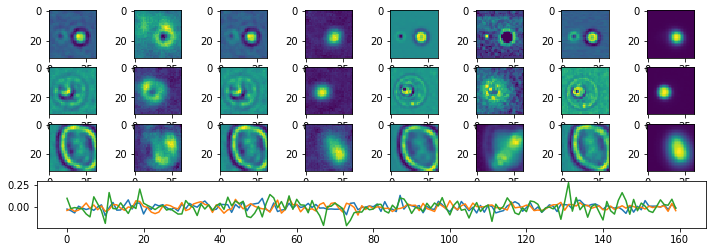

Epoch:  41 Iteration:  0 Loss:  3.70756 0.6301 0.000532746


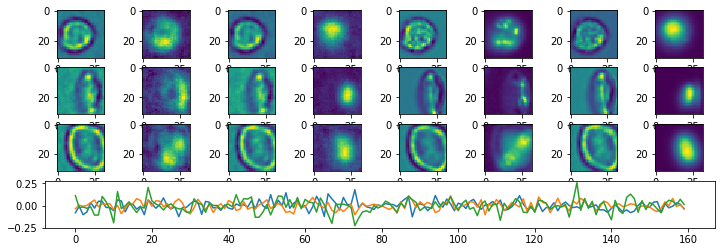

Epoch:  42 Iteration:  0 Loss:  3.64553 0.630067 0.000389755


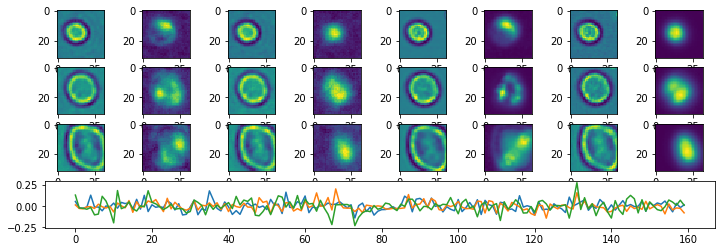

Epoch:  43 Iteration:  0 Loss:  3.63664 0.630063 0.000851214


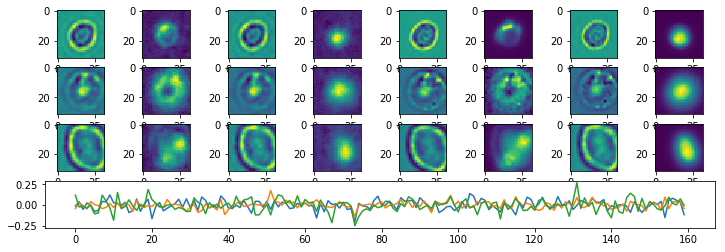

Epoch:  44 Iteration:  0 Loss:  3.5265 0.630006 0.000296742


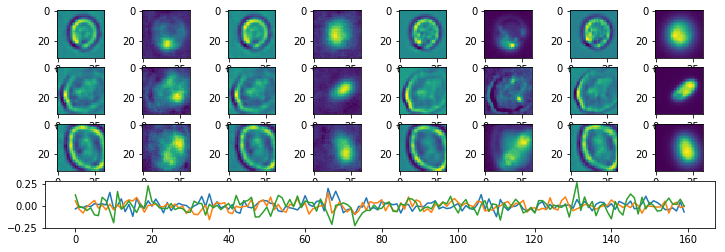

Epoch:  45 Iteration:  0 Loss:  3.50712 0.629996 0.000336736


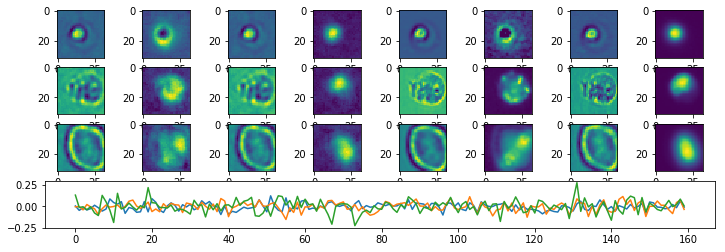

Epoch:  46 Iteration:  0 Loss:  3.48437 0.629986 0.000145912


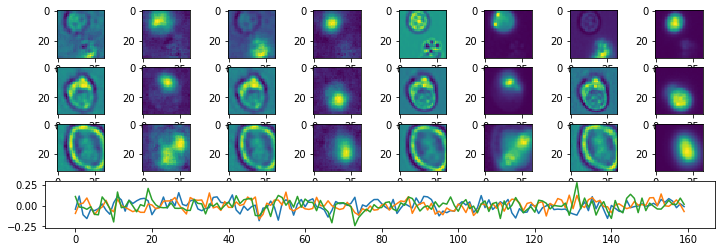

Epoch:  47 Iteration:  0 Loss:  3.43614 0.629959 0.000588924


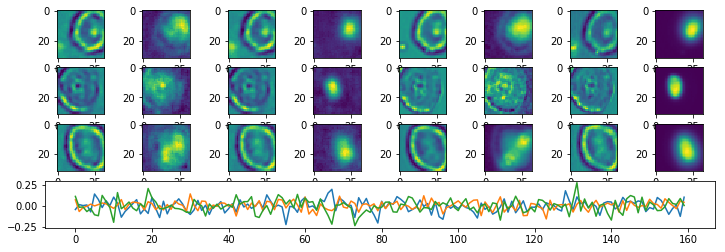

Epoch:  48 Iteration:  0 Loss:  3.40823 0.629943 0.000489235


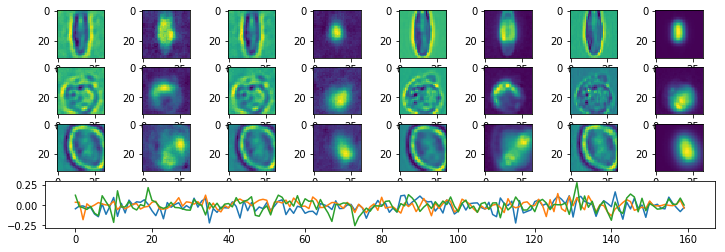

Epoch:  49 Iteration:  0 Loss:  3.36148 0.62992 0.00044623


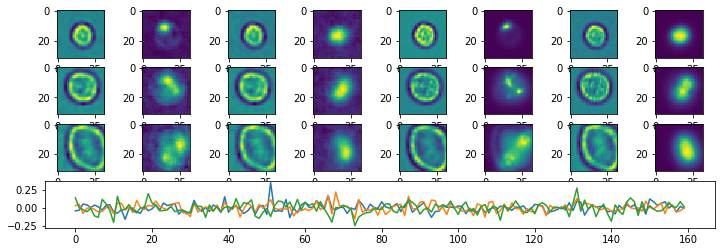

Epoch:  50 Iteration:  0 Loss:  3.35291 0.629915 0.000576258


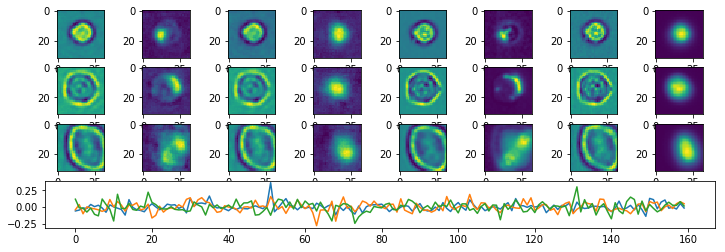

Epoch:  51 Iteration:  0 Loss:  3.30477 0.629891 0.000555694


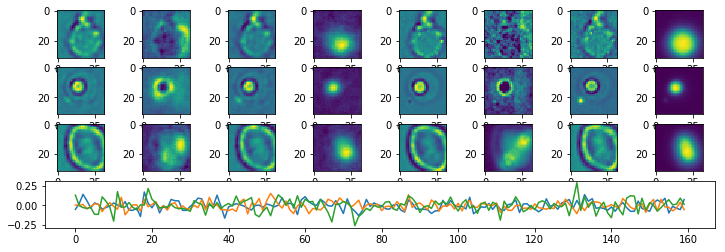

Epoch:  52 Iteration:  0 Loss:  3.32215 0.6299 0.000549495


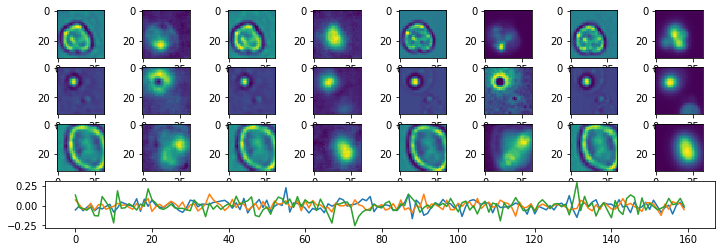

Epoch:  53 Iteration:  0 Loss:  3.2905 0.629884 0.000376135


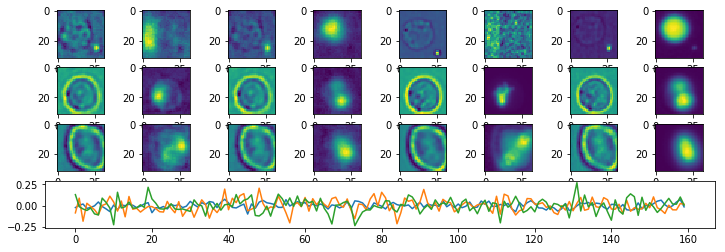

Epoch:  54 Iteration:  0 Loss:  3.25038 0.629862 0.000454307


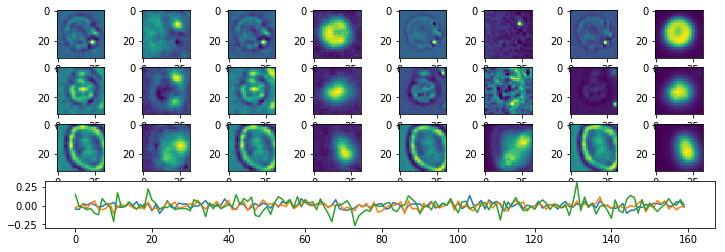

Epoch:  55 Iteration:  0 Loss:  3.25587 0.629867 0.000264406


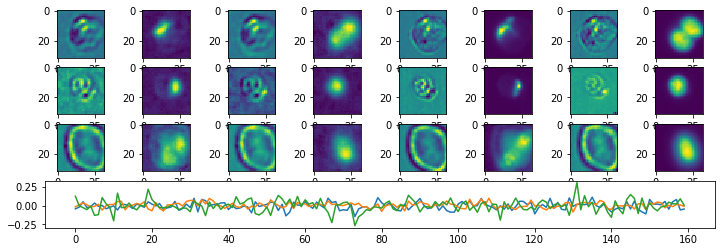

Epoch:  56 Iteration:  0 Loss:  3.21042 0.629841 0.000526041


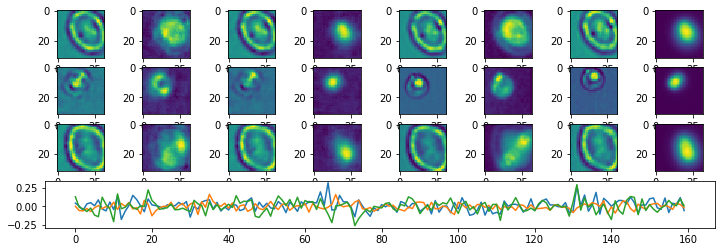

Epoch:  57 Iteration:  0 Loss:  3.33373 0.629907 0.000623465


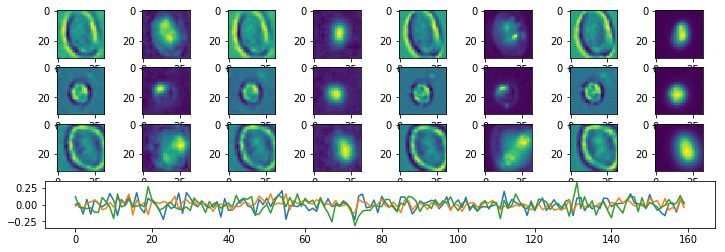

Epoch:  58 Iteration:  0 Loss:  3.19752 0.629837 0.000508398


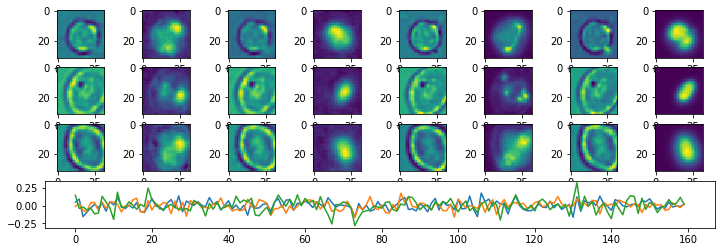

Epoch:  59 Iteration:  0 Loss:  3.16853 0.62982 0.000382632


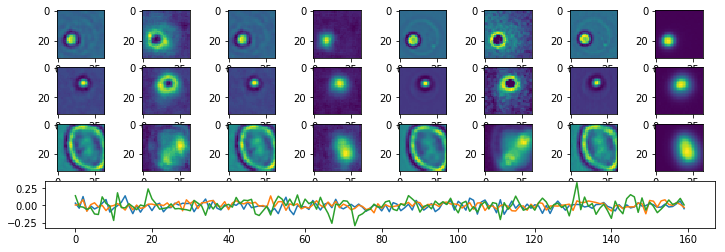

Epoch:  60 Iteration:  0 Loss:  3.20596 0.629842 0.000437319


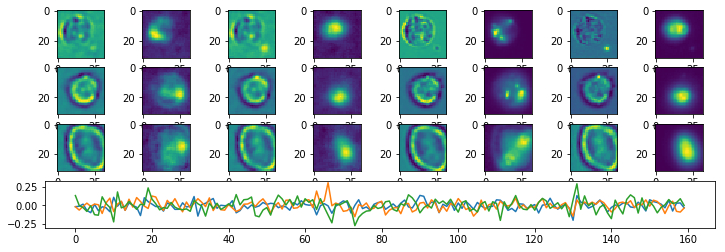

Epoch:  61 Iteration:  0 Loss:  3.183 0.629828 0.000314057


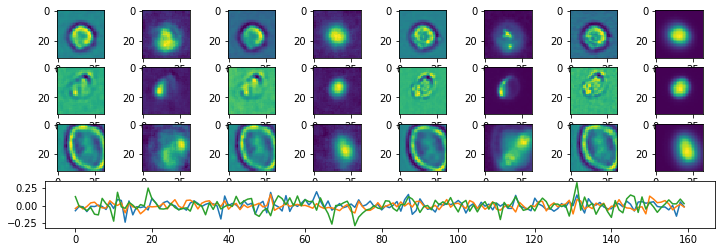

Epoch:  62 Iteration:  0 Loss:  3.18349 0.629831 0.000342429


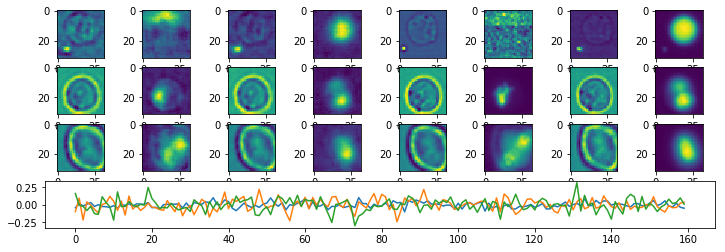

Epoch:  63 Iteration:  0 Loss:  3.14217 0.629812 0.00038299


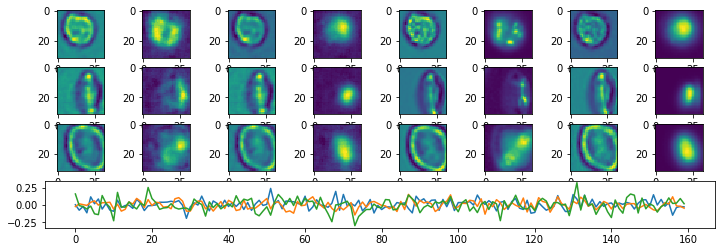

Epoch:  64 Iteration:  0 Loss:  3.13819 0.629804 0.000583231


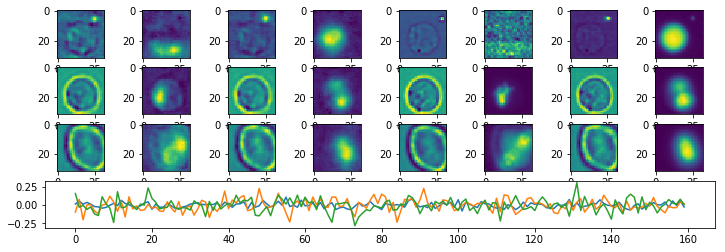

Epoch:  65 Iteration:  0 Loss:  3.09355 0.629781 0.00031516


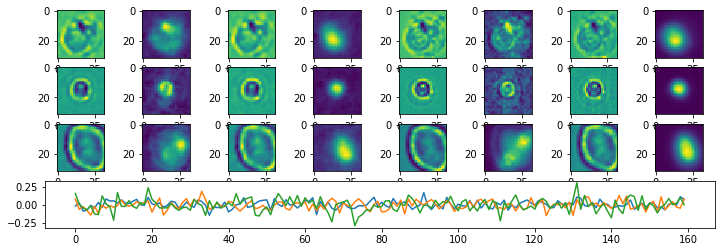

Epoch:  66 Iteration:  0 Loss:  3.10811 0.62979 0.000415713


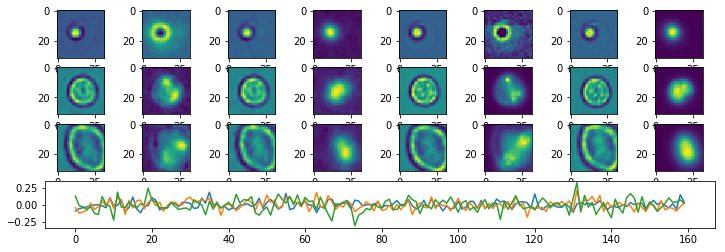

Epoch:  67 Iteration:  0 Loss:  3.06727 0.629769 0.000300467


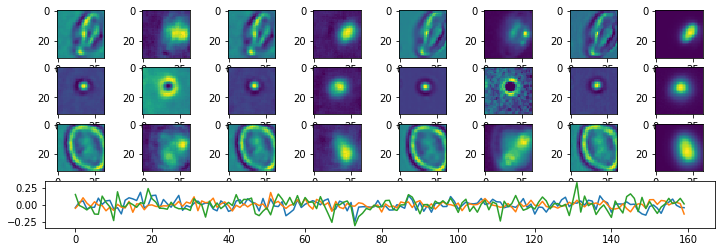

Epoch:  68 Iteration:  0 Loss:  3.04873 0.629759 0.000424773


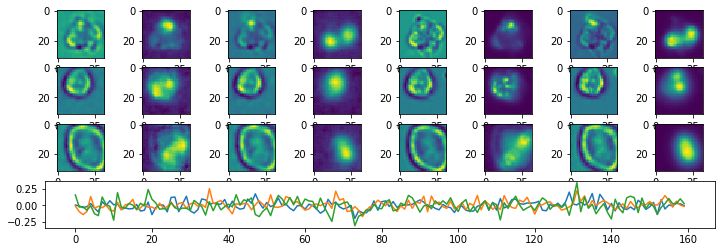

Epoch:  69 Iteration:  0 Loss:  3.06211 0.629766 0.000392944


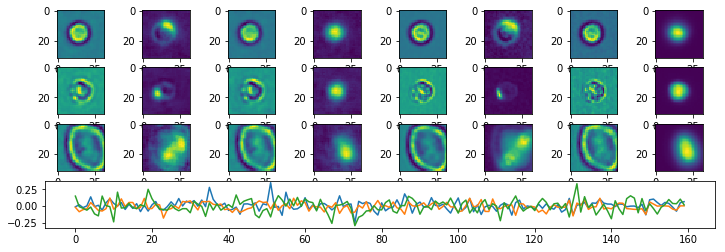

Epoch:  70 Iteration:  0 Loss:  3.01541 0.629742 0.000584036


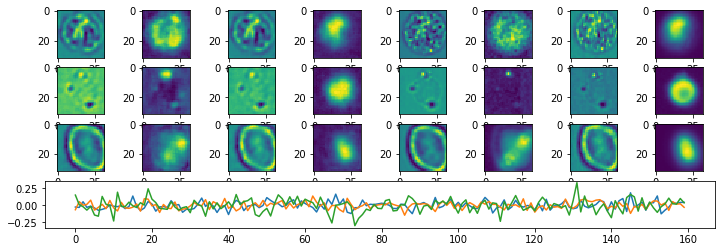

Epoch:  71 Iteration:  0 Loss:  3.05132 0.629761 0.000190228


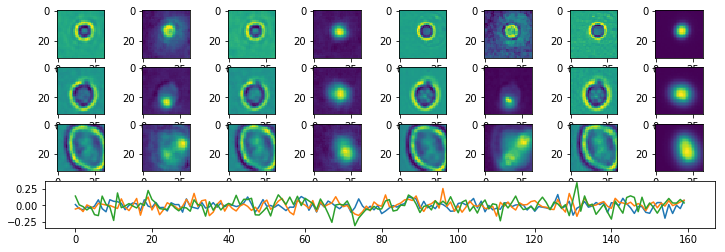

Epoch:  72 Iteration:  0 Loss:  2.98797 0.629728 0.00014317


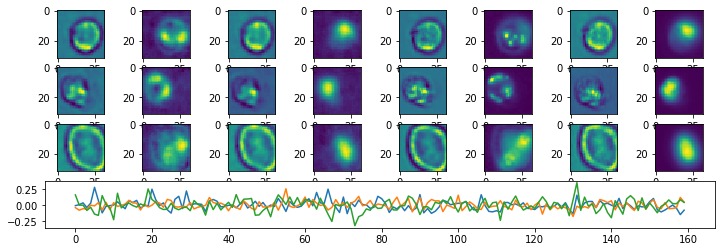

Epoch:  73 Iteration:  0 Loss:  2.9843 0.629726 0.000350505


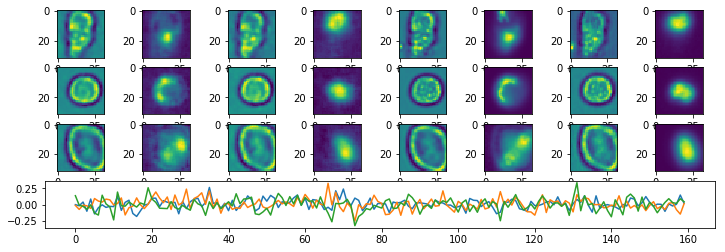

Epoch:  74 Iteration:  0 Loss:  2.97915 0.629724 0.000737846


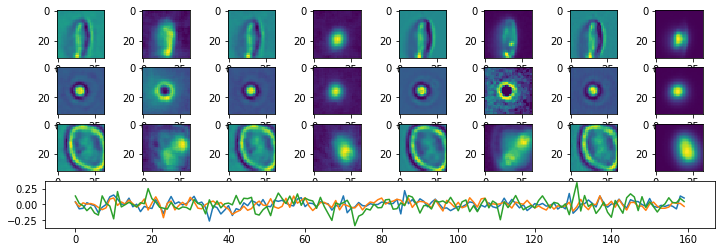

Epoch:  75 Iteration:  0 Loss:  4.3953 0.630473 0.00122005


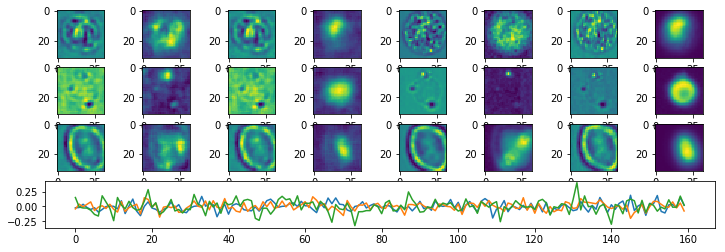

Epoch:  76 Iteration:  0 Loss:  3.46509 0.629978 0.000517875


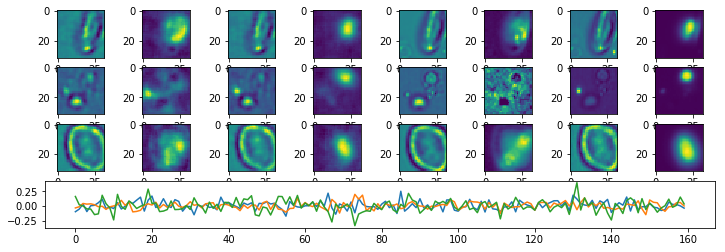

Epoch:  77 Iteration:  0 Loss:  3.33771 0.62991 0.000538796


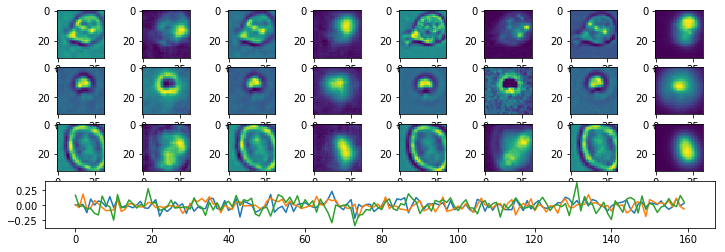

Epoch:  78 Iteration:  0 Loss:  3.20612 0.629842 0.000538528


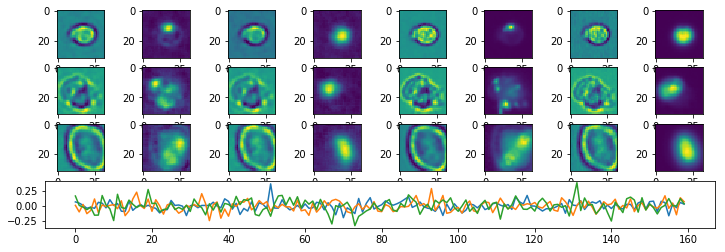

Epoch:  79 Iteration:  0 Loss:  3.17005 0.629823 0.000421822


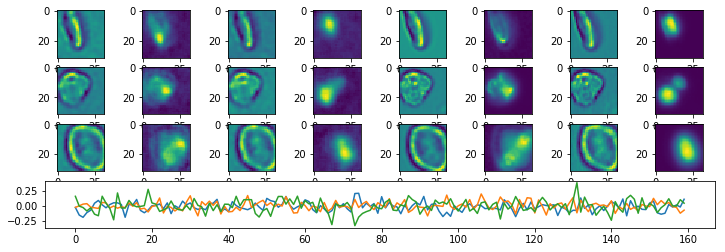

Epoch:  80 Iteration:  0 Loss:  3.12684 0.629801 0.000515431


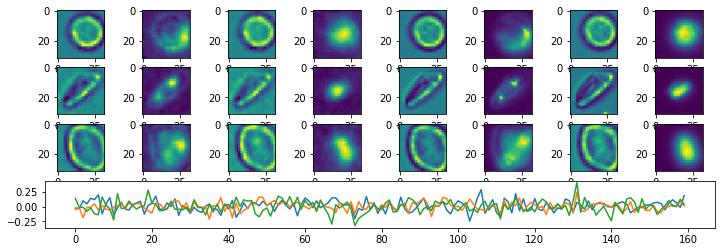

Epoch:  81 Iteration:  0 Loss:  3.11486 0.629794 0.000506818


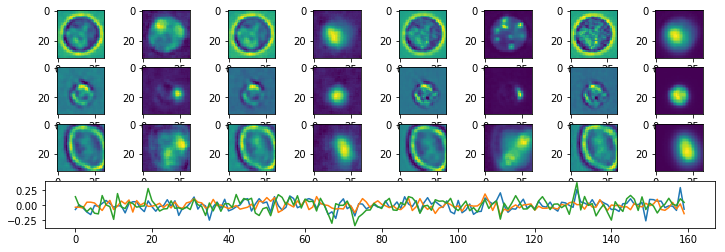

Epoch:  82 Iteration:  0 Loss:  3.09744 0.629785 0.000534922


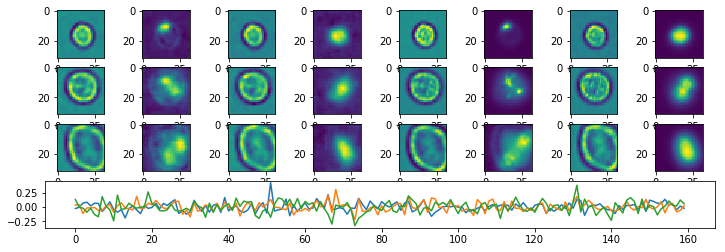

Epoch:  83 Iteration:  0 Loss:  3.05208 0.629762 0.000502855


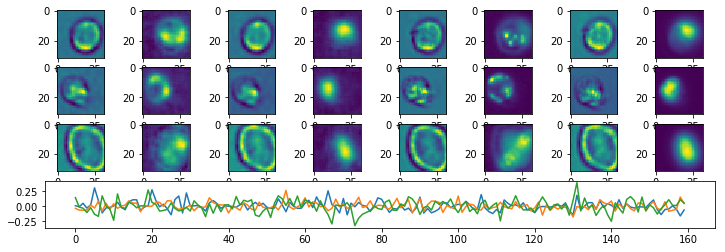

Epoch:  84 Iteration:  0 Loss:  3.03301 0.629752 0.00045523


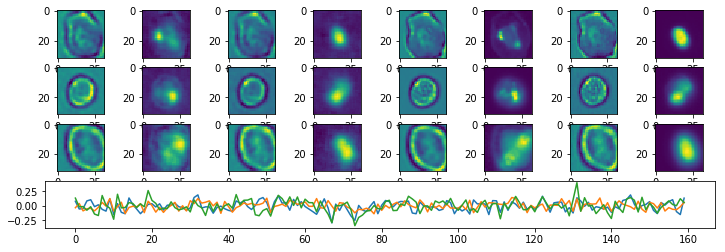

Epoch:  85 Iteration:  0 Loss:  3.03287 0.629751 0.000564694


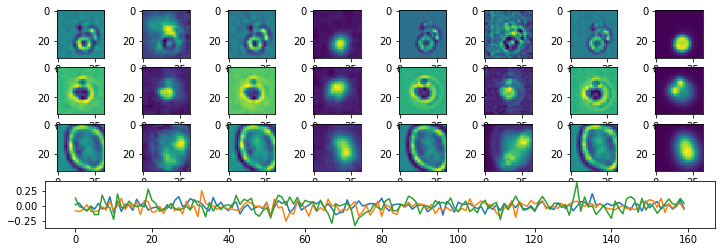

Epoch:  86 Iteration:  0 Loss:  3.00497 0.629737 0.000455141


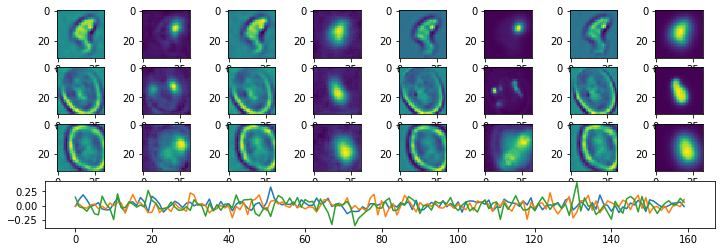

Epoch:  87 Iteration:  0 Loss:  2.99826 0.629734 0.000436991


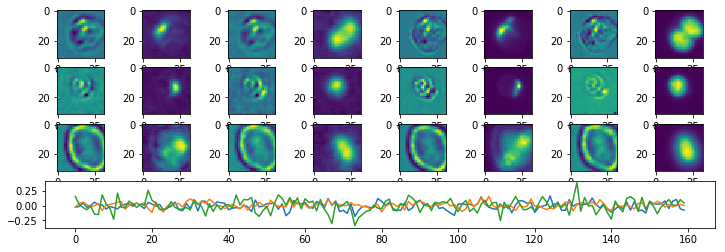

Epoch:  88 Iteration:  0 Loss:  3.021 0.629752 0.000508964


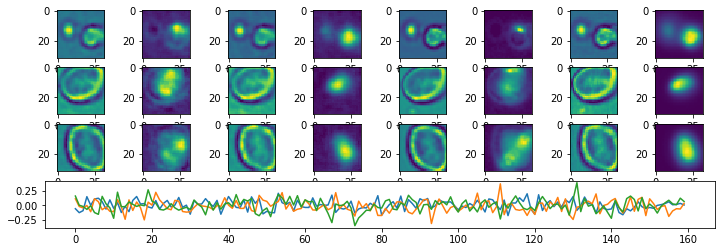

Epoch:  89 Iteration:  0 Loss:  3.0023 0.629736 0.000367343


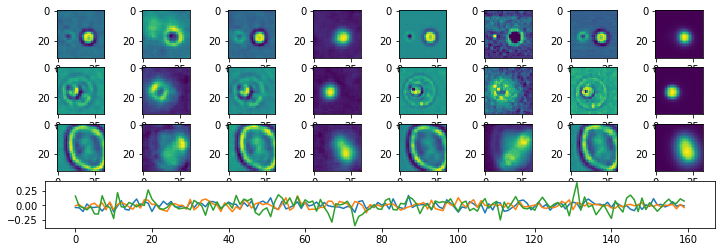

Epoch:  90 Iteration:  0 Loss:  3.0016 0.629738 0.000494421


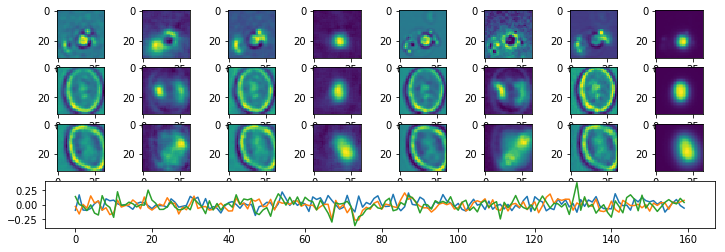

Epoch:  91 Iteration:  0 Loss:  2.99356 0.629731 0.000477374


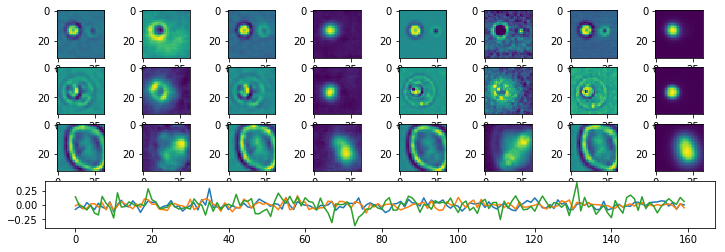

Epoch:  92 Iteration:  0 Loss:  2.96306 0.629716 0.000343233


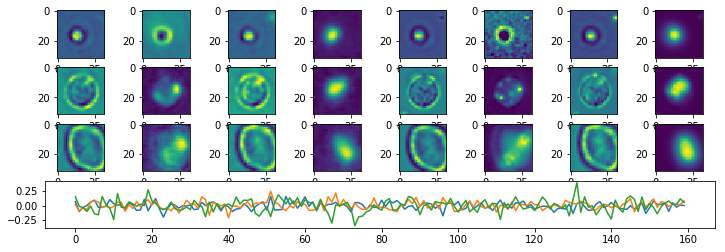

Epoch:  93 Iteration:  0 Loss:  2.94036 0.629703 0.000424176


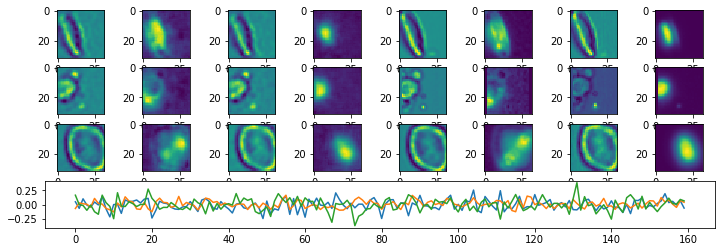

Epoch:  94 Iteration:  0 Loss:  2.96128 0.629715 0.000362009


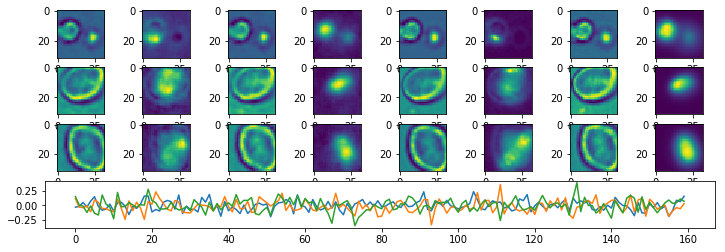

Epoch:  95 Iteration:  0 Loss:  2.95318 0.629711 0.000480831


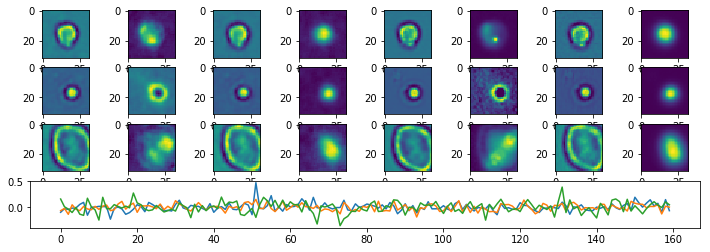

Epoch:  96 Iteration:  0 Loss:  2.908 0.629687 0.000462115


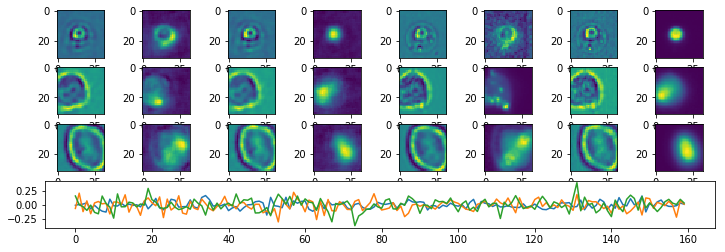

Epoch:  97 Iteration:  0 Loss:  2.93051 0.6297 0.00035432


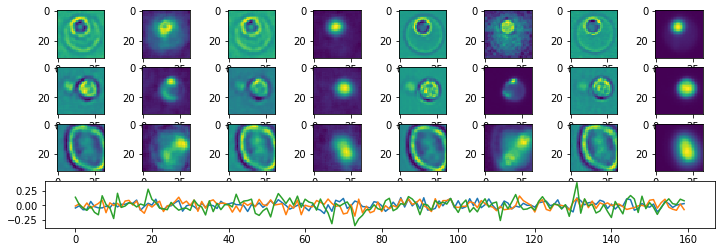

Epoch:  98 Iteration:  0 Loss:  2.89947 0.629683 0.000466853


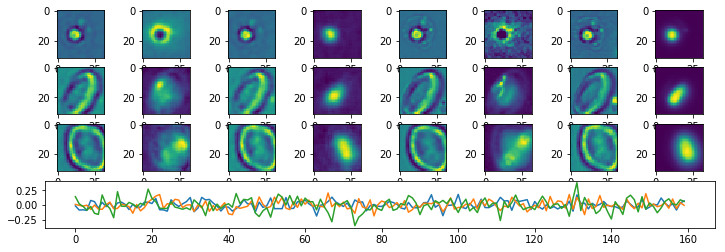

Epoch:  99 Iteration:  0 Loss:  2.88444 0.629676 0.00046286


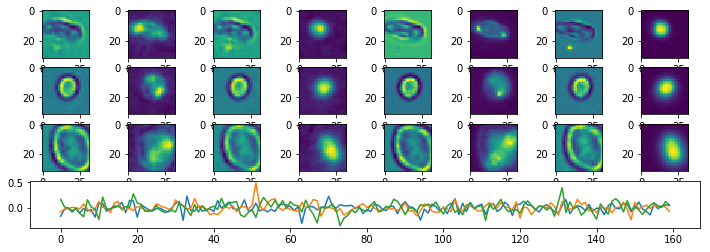

Epoch:  100 Iteration:  0 Loss:  2.86794 0.629667 0.000506818


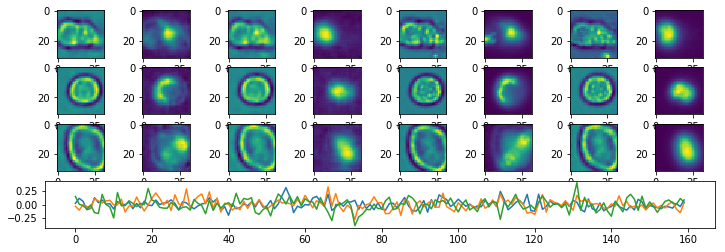

Epoch:  101 Iteration:  0 Loss:  2.85901 0.629662 0.000546336


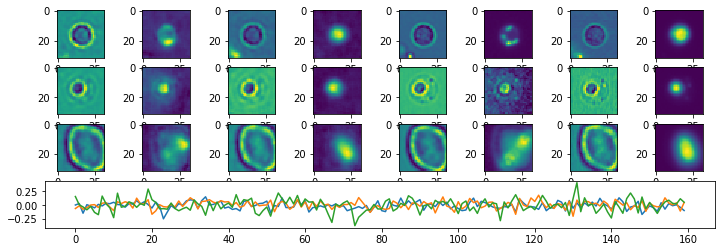

Epoch:  102 Iteration:  0 Loss:  2.84529 0.629655 0.000415415


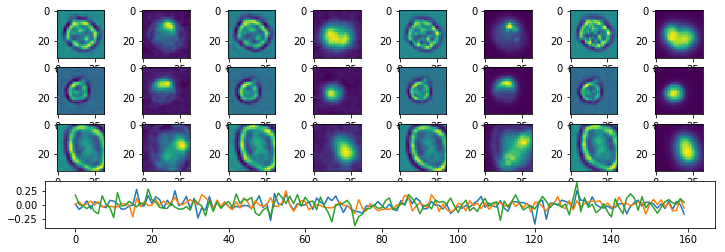

Epoch:  103 Iteration:  0 Loss:  2.84005 0.629652 0.000464141


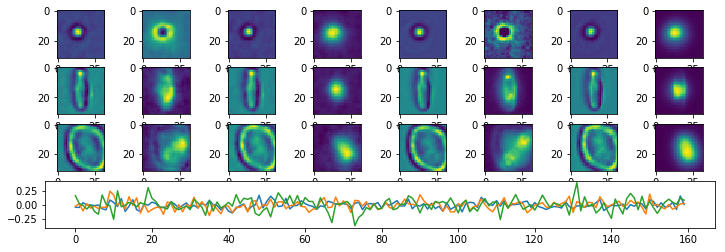

Epoch:  104 Iteration:  0 Loss:  2.85343 0.62966 0.000211418


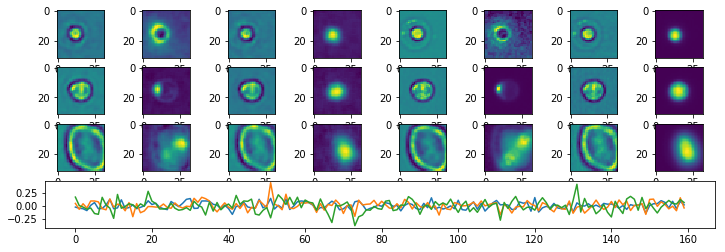

Epoch:  105 Iteration:  0 Loss:  2.84989 0.629658 0.000495553


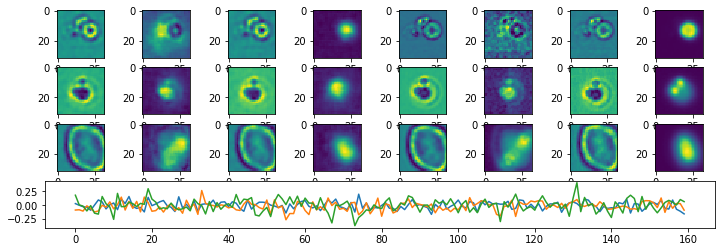

Epoch:  106 Iteration:  0 Loss:  2.8088 0.629637 0.000176728


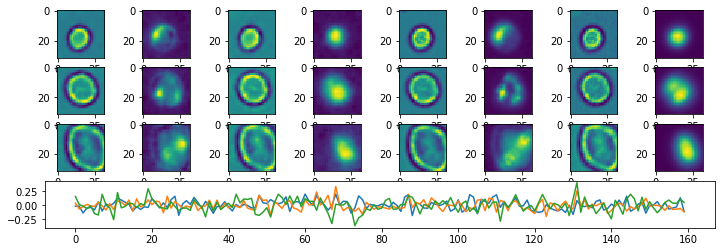

Epoch:  107 Iteration:  0 Loss:  2.80099 0.629632 0.000540584


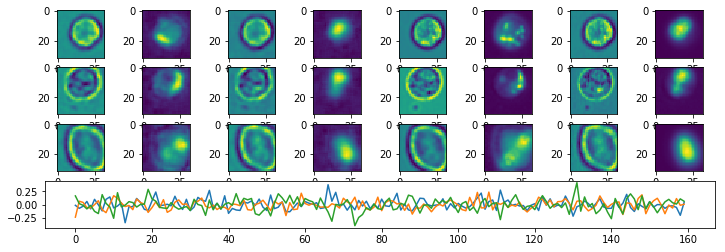

Epoch:  108 Iteration:  0 Loss:  2.83827 0.629652 0.000711501


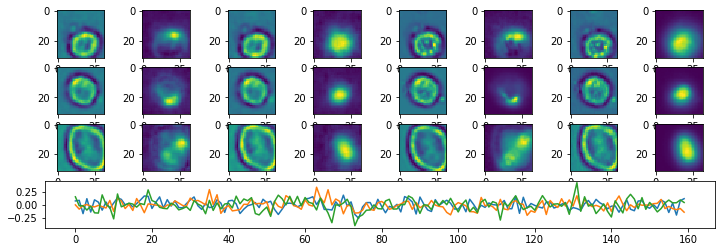

Epoch:  109 Iteration:  0 Loss:  2.76978 0.629616 0.00051102


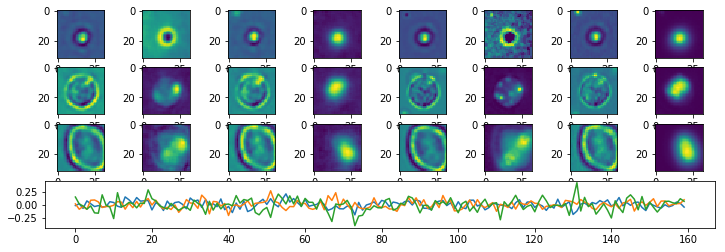

Epoch:  110 Iteration:  0 Loss:  2.77364 0.629619 0.000389606


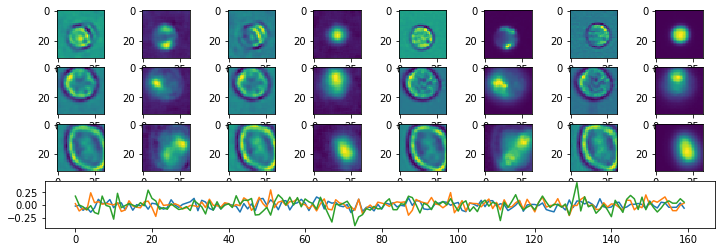

Epoch:  111 Iteration:  0 Loss:  2.75427 0.629608 9.33707e-05


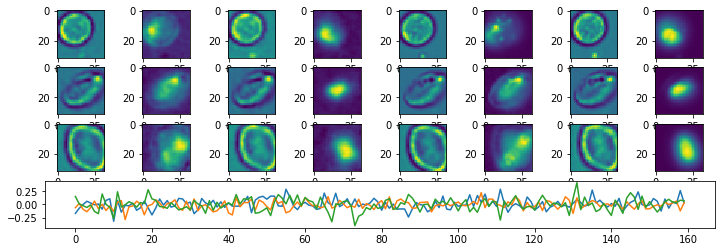

Epoch:  112 Iteration:  0 Loss:  2.75195 0.629608 0.000441581


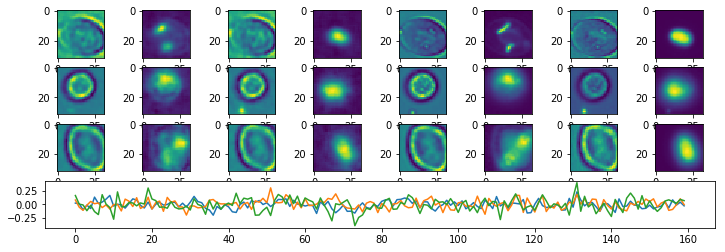

Epoch:  113 Iteration:  0 Loss:  2.73577 0.629599 0.000621349


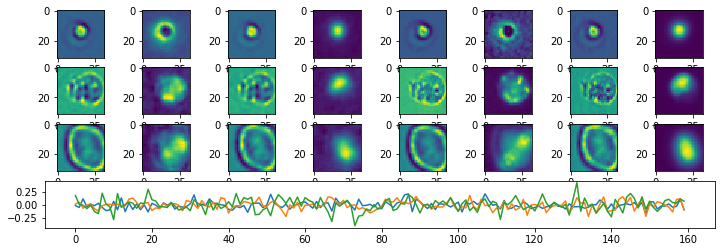

Epoch:  114 Iteration:  0 Loss:  2.72317 0.629592 0.000115067


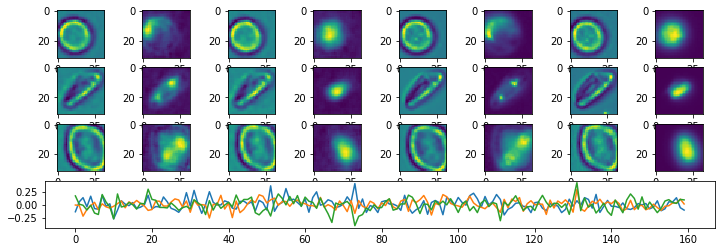

Epoch:  115 Iteration:  0 Loss:  2.72613 0.629594 0.000472426


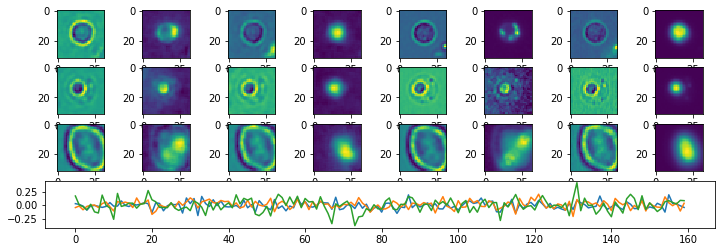

Epoch:  116 Iteration:  0 Loss:  2.69864 0.62958 0.000622332


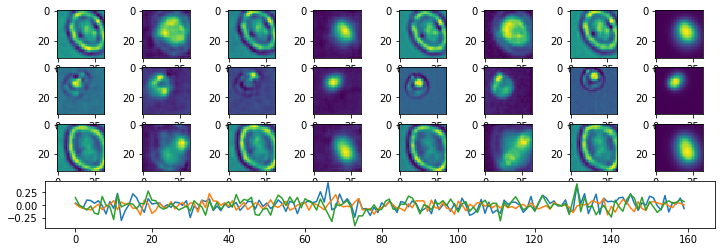

Epoch:  117 Iteration:  0 Loss:  2.75847 0.629609 0.000412971


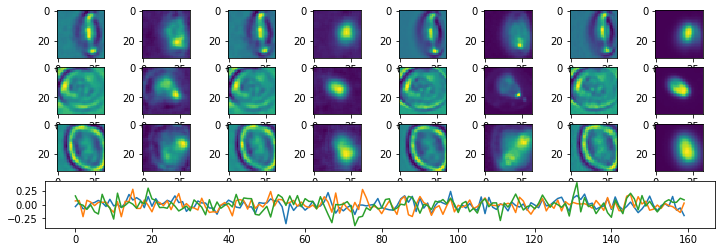

Epoch:  118 Iteration:  0 Loss:  2.73783 0.6296 0.000485122


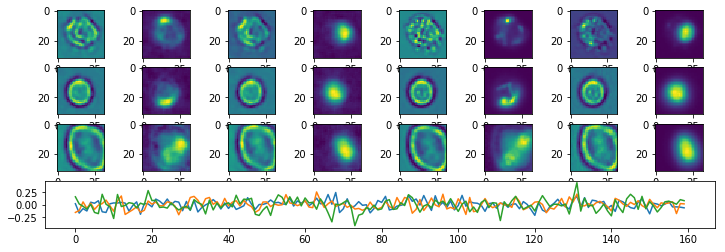

Epoch:  119 Iteration:  0 Loss:  2.70644 0.629584 0.000544935


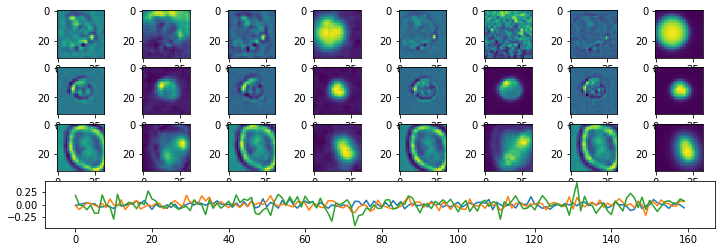

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 160 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-25-LS160"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4